# Household distribution
In this script we distribute all the households given in the FIES according to the population distribution. Therefore, we apply the following steps:
1. Eliminating the weights and work with single HHs
2. Getting relative population distribution (using 2015 values)
3. Distributing HHs according to rules and some randomization
4. Overlapping the HH-maps with floods

In [1]:
import sys
sys.path.append('/home/insauer/Climada/climada_python')
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
from climada.hazard.river_flood import RiverFlood
from climada.hazard.centroids import Centroids
from shapely.geometry.multipolygon import MultiPolygon
from climada.entity.exposures.gdp_asset import GDP2Asset
from climada.entity.impact_funcs.river_flood import flood_imp_func_set
from climada.engine import Impact

/home/insauer/anaconda3/envs/climada_env/lib/python3.7/site-packages/pandas_datareader/compat/__init__.py:7: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


We first calculate an example for the first region

In [2]:
survey_data = pd.read_csv('/home/insauer/projects/WB_model/hhwb/data/FIES_prepared/survey_PHL.csv')
survey_data

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor
0,0,0,14,211.1572,9,480332,38760,0.176911,48553.754281,21240.29,0,0
1,1,1,14,211.1572,6,198235,0,0.089133,17489.704141,21240.29,0,0
2,2,2,14,211.1572,2,82785,9600,0.433572,940.544158,21240.29,0,1
3,3,3,14,211.1572,3,107589,8800,0.479037,4911.259021,21240.29,0,0
4,4,4,14,211.1572,6,189322,0,0.129026,17489.704141,21240.29,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
41539,41539,41539,12,392.6993,3,119773,7400,0.155244,4911.259021,21030.95,0,1
41540,41540,41540,12,392.6993,4,137320,11000,0.142635,7776.710734,21030.95,0,0
41541,41541,41541,12,392.6993,4,133171,0,0.196871,7776.710734,21030.95,0,0
41542,41542,41542,12,392.6993,4,129500,3300,0.159823,7776.710734,21030.95,0,1


In [3]:
regions = list((set(survey_data['region'])))
regions

[1, 2, 3, 5, 6, 7, 8, 41, 10, 11, 42, 13, 14, 15, 16, 12, 9]

In [5]:
#Select only the first region
reg_data = survey_data.loc[survey_data['region']==2]
reg_data

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor
2510,2510,2510,2,397.5724,7,247890,24000,0.164072,25473.290679,29118.32,0,0
2511,2511,2511,2,397.5724,10,685454,1152,0.179326,132688.289357,29118.32,0,0
2512,2512,2512,2,397.5724,8,312110,17000,0.190592,35009.337067,29118.32,0,0
2513,2513,2513,2,397.5724,6,203782,0,0.135150,17489.704141,29118.32,0,0
2514,2514,2514,2,397.5724,10,647517,84000,0.143181,132688.289357,29118.32,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
29908,29908,29908,2,330.0060,4,130940,2000,0.473610,7776.710734,20940.56,0,0
29909,29909,29909,2,330.0060,3,101313,4000,0.433023,4911.259021,20940.56,0,1
29910,29910,29910,2,330.0060,3,119816,15000,0.321931,4911.259021,20940.56,0,1
29911,29911,29911,2,330.0060,6,189775,2000,0.194841,17489.704141,20940.56,0,0


In [6]:
reg_data['res_weight']= reg_data['weight'] - reg_data['weight'].astype(int)
reg_data

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,res_weight
2510,2510,2510,2,397.5724,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724
2511,2511,2511,2,397.5724,10,685454,1152,0.179326,132688.289357,29118.32,0,0,0.5724
2512,2512,2512,2,397.5724,8,312110,17000,0.190592,35009.337067,29118.32,0,0,0.5724
2513,2513,2513,2,397.5724,6,203782,0,0.135150,17489.704141,29118.32,0,0,0.5724
2514,2514,2514,2,397.5724,10,647517,84000,0.143181,132688.289357,29118.32,0,0,0.5724
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29908,29908,29908,2,330.0060,4,130940,2000,0.473610,7776.710734,20940.56,0,0,0.0060
29909,29909,29909,2,330.0060,3,101313,4000,0.433023,4911.259021,20940.56,0,1,0.0060
29910,29910,29910,2,330.0060,3,119816,15000,0.321931,4911.259021,20940.56,0,1,0.0060
29911,29911,29911,2,330.0060,6,189775,2000,0.194841,17489.704141,20940.56,0,0,0.0060


In [8]:
reg_data = reg_data.sort_values(['res_weight'], ascending=False)

In [9]:
reg_data

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,res_weight
15198,15198,15198,2,424.9989,6,204367,51400,0.120995,17489.704141,22423.95,0,0,0.9989
15213,15213,15213,2,424.9989,4,137800,8800,0.158281,7776.710734,22423.95,0,0,0.9989
15200,15200,15200,2,424.9989,2,88248,0,0.110313,940.544158,22423.95,0,1,0.9989
15197,15197,15197,2,424.9989,6,194793,0,0.089116,17489.704141,22423.95,0,0,0.9989
15199,15199,15199,2,424.9989,5,170858,0,0.180077,12651.577415,22423.95,0,0,0.9989
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26209,26209,26209,2,330.0060,3,104995,0,0.158555,4911.259021,22123.31,0,0,0.0060
26207,26207,26207,2,330.0060,4,133862,11100,0.112022,7776.710734,22123.31,0,0,0.0060
26056,26056,26056,2,330.0060,8,332624,0,0.146940,35009.337067,22123.31,0,0,0.0060
6671,6671,6671,2,330.0060,5,154880,10000,0.160530,12651.577415,21085.83,0,0,0.0060


In [10]:
# compute total number households
tot_hh = reg_data['weight'].sum().round()
tot_hh

816087.0

In [11]:
int_hh = reg_data['weight'].astype(int).sum()
int_hh

815045

In [12]:
missing_hh = tot_hh - int_hh
missing_hh

1042.0

In [13]:
reg_data.iloc[:1042,:]

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,res_weight
15198,15198,15198,2,424.9989,6,204367,51400,0.120995,17489.704141,22423.95,0,0,0.9989
15213,15213,15213,2,424.9989,4,137800,8800,0.158281,7776.710734,22423.95,0,0,0.9989
15200,15200,15200,2,424.9989,2,88248,0,0.110313,940.544158,22423.95,0,1,0.9989
15197,15197,15197,2,424.9989,6,194793,0,0.089116,17489.704141,22423.95,0,0,0.9989
15199,15199,15199,2,424.9989,5,170858,0,0.180077,12651.577415,22423.95,0,0,0.9989
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6110,6110,6110,2,356.4446,4,136488,0,0.177083,7776.710734,21085.83,0,0,0.4446
6102,6102,6102,2,356.4446,10,979762,86400,0.105386,132688.289357,21085.83,0,0,0.4446
6099,6099,6099,2,356.4446,8,348829,0,0.180385,35009.337067,21085.83,0,0,0.4446
6103,6103,6103,2,356.4446,3,118320,9000,0.085713,4911.259021,21085.83,0,0,0.4446


In [14]:
region_df = pd.DataFrame()
c=0
for region in regions[1:2]:
    hhids = list(reg_data['hhid'])
    print(len(hhids))
    
    for i,hhid in enumerate(hhids):
        #print(str(i) + '   '+str(hhid))
        cur_hh = reg_data.loc[reg_data['hhid']== hhid]
        w = int(cur_hh['weight'].values[0])
        print(c)
        if c < missing_hh:
            hh_instance = np.arange(w+1)
            region_df = region_df.append([cur_hh]*(w+1),ignore_index=True)
            region_df.loc[region_df['hhid']==hhid, 'hh_instance'] = hh_instance
        else:
            hh_instance = np.arange(w)
            region_df = region_df.append([cur_hh]*(w),ignore_index=True)
            region_df.loc[region_df['hhid']==hhid, 'hh_instance'] = hh_instance
        c+=1


2219
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
2

1860
1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059


In [15]:
region_df.loc[region_df['hhid'] == 6107]


,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,res_weight,hh_instance
385888,6107,6107,2,356.4446,1,59162,27000,0.153324,0.0,21085.83,0,0,0.4446,0.0
385889,6107,6107,2,356.4446,1,59162,27000,0.153324,0.0,21085.83,0,0,0.4446,1.0
385890,6107,6107,2,356.4446,1,59162,27000,0.153324,0.0,21085.83,0,0,0.4446,2.0
385891,6107,6107,2,356.4446,1,59162,27000,0.153324,0.0,21085.83,0,0,0.4446,3.0
385892,6107,6107,2,356.4446,1,59162,27000,0.153324,0.0,21085.83,0,0,0.4446,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386240,6107,6107,2,356.4446,1,59162,27000,0.153324,0.0,21085.83,0,0,0.4446,352.0
386241,6107,6107,2,356.4446,1,59162,27000,0.153324,0.0,21085.83,0,0,0.4446,353.0
386242,6107,6107,2,356.4446,1,59162,27000,0.153324,0.0,21085.83,0,0,0.4446,354.0
386243,6107,6107,2,356.4446,1,59162,27000,0.153324,0.0,21085.83,0,0,0.4446,355.0


In [16]:
region_df = region_df.sort_values(['hh_instance'])
region_df = region_df.drop(columns=['Unnamed: 0'])
region_df.to_csv('/home/insauer/projects/WB_model/hhwb/data/FIES_prepared/region_hh_02.csv')

c = 0
for region in regions:
    print(region)
    hh_data_reg = survey_data[survey_data['region']==region]
    hhids = list((set(hh_data_reg['hhid'])))
    print(len(hhids))
    for i,hhid in enumerate(hhids):
        #print(str(i) + '   '+str(hhid))
        cur_hh = hh_data_reg.loc[hh_data_reg['hhid']== hhid]
        w = int(np.round(cur_hh['weight'].values[0]))
        hh_instance = np.arange(w)
        hh_sample = np.ones(w)*hhid
        hh_region = np.ones(w)*region
        hh_assign[c:c+w,0] = hh_region
        hh_assign[c:c+w,1] = hh_sample
        hh_assign[c:c+w,2] = hh_instance
        c = c+w
hh_assign = hh_assign.astype(int)
hh_assign
hh_reg = hh_assign[np.where(hh_assign[:,0]==14)[0],:]

In [17]:
region_df = pd.read_csv('/home/insauer/projects/WB_model/hhwb/data/FIES_prepared/region_hh_02.csv')

In [18]:
region_df['Longitude'] = np.nan
region_df['Latitude'] = np.nan
region_df['Centroid_ID'] = np.nan
region_df

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,res_weight,hh_instance,Longitude,Latitude,Centroid_ID
0,0,15198,2,424.9989,6,204367,51400,0.120995,17489.704141,22423.95,0,0,0.9989,0.0,NaN,NaN,NaN
1,619674,6346,2,371.2567,9,472975,0,0.098231,48553.754281,21085.83,0,0,0.2567,0.0,NaN,NaN,NaN
2,279550,6330,2,330.6582,5,150108,9200,0.080675,12651.577415,21085.83,0,1,0.6582,0.0,NaN,NaN,NaN
3,748576,6426,2,349.0281,9,441258,0,0.190505,48553.754281,21085.83,0,0,0.0281,0.0,NaN,NaN,NaN
4,279219,6331,2,330.6582,1,35698,9500,0.165925,0.000000,21085.83,0,0,0.6582,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
816082,440261,15105,2,663.3870,9,437060,264000,0.115594,48553.754281,24130.20,1,0,0.3870,662.0,NaN,NaN,NaN
816083,448880,15116,2,663.3870,7,260710,0,0.122725,25473.290679,24130.20,1,0,0.3870,662.0,NaN,NaN,NaN
816084,447554,15115,2,663.3870,10,603248,0,0.129499,132688.289357,24130.20,1,0,0.3870,662.0,NaN,NaN,NaN
816085,444902,15122,2,663.3870,2,80015,28000,0.138470,940.544158,24130.20,1,0,0.3870,662.0,NaN,NaN,NaN


In [19]:
shape_path = '/home/insauer/projects/WB_model/hhwb/data/shapes/phl_adm_psa_namria_20200529_shp/phl_admbnda_adm1_psa_namria_20200529.shp'
prvS = gpd.GeoDataFrame()
prvS = gpd.read_file(shape_path)
prvS

,Shape_Leng,Shape_Area,ADM1_EN,ADM1_PCODE,ADM1_REF,ADM1ALT1EN,ADM1ALT2EN,ADM0_EN,ADM0_PCODE,date,validOn,validTo,geometry
0,53.623497,1.050272,Autonomous Region in Muslim Mindanao,PH150000000,None,ARMM,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((119.46876 4.59360, 119.46881 4..."
1,8.027454,1.546712,Cordillera Administrative Region,PH140000000,None,CAR,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"POLYGON ((121.22208 18.50058, 121.22086 18.483..."
2,2.320234,0.050216,National Capital Region,PH130000000,None,NCR,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"POLYGON ((121.03842 14.78525, 121.03876 14.785..."
3,14.995101,1.043983,Region I,PH010000000,None,Ilocos Region,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((119.86596 15.81539, 119.86597 ..."
4,19.139048,2.241812,Region II,PH020000000,None,Cagayan Valley,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((122.46667 16.92135, 122.46674 ..."
5,15.949563,1.793513,Region III,PH030000000,None,Central Luzon,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((120.11687 14.76309, 120.11689 ..."
6,27.624115,1.326710,Region IV-A,PH040000000,None,Calabarzon,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((122.72165 13.36485, 122.72181 ..."
7,78.804542,2.220374,Region IV-B,PH170000000,None,Mimaropa,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((117.31260 7.50671, 117.31249 7..."
8,23.181441,1.196677,Region IX,PH090000000,None,Zamboanga Peninsula,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((121.88379 6.69138, 121.88380 6..."
9,44.923243,1.446324,Region V,PH050000000,None,Bicol Region,None,Philippines (the),PH,2016-06-30,2020-05-29,None,"MULTIPOLYGON (((122.98823 11.73079, 122.98824 ..."


In [20]:
shape = prvS.loc[prvS['ADM1_PCODE']=='PH020000000', 'geometry'].values[0]
shape

/home/insauer/Climada/climada_python/climada/util/plot.py:314: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()
/home/insauer/anaconda3/envs/climada_env/lib/python3.7/site-packages/cartopy/mpl/feature_artist.py:225: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.
  **dict(style))


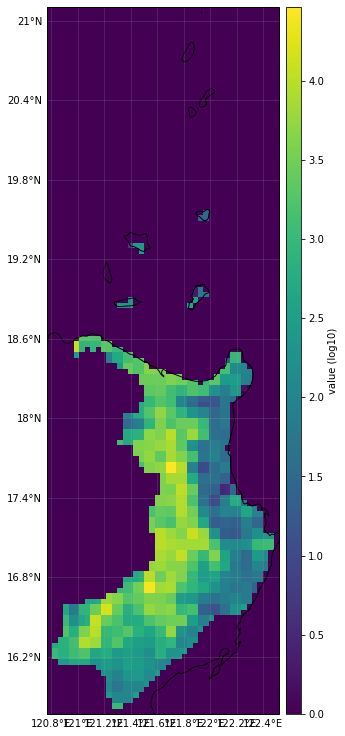

In [21]:
gdpa = GDP2Asset()

gdpa.set_from_raster(file_name='/home/insauer/data/Tobias/hyde_ssp2_1980-2015_0150as_yearly_zip.nc4', band=16, src_crs=None, window=False,
                        geometry=shape)
gdpa.plot_raster()

In [22]:
gdpa['people_share']= gdpa['value']/gdpa['value'].sum()
gdpa

,longitude,latitude,value,people_share
0,120.770349,21.103986,0.0,0.0
1,120.812015,21.103986,0.0,0.0
2,120.853682,21.103986,0.0,0.0
3,120.895349,21.103986,0.0,0.0
4,120.937015,21.103986,0.0,0.0
...,...,...,...,...
5542,122.353680,15.770661,0.0,0.0
5543,122.395346,15.770661,0.0,0.0
5544,122.437013,15.770661,0.0,0.0
5545,122.478679,15.770661,0.0,0.0


In [23]:
gdpa['nhh'] = gdpa['people_share'] * region_df.shape[0]
gdpa['res'] = gdpa['nhh'] - gdpa['nhh'].astype(int)
gdpa['nhh'] = gdpa['nhh'].astype(int)
total_hh = gdpa['nhh'].sum()
rest_hh = region_df.shape[0] - total_hh
rest_hh

624

In [24]:
hh_add = gdpa.sort_values(['res'], ascending=False).iloc[:rest_hh, 4].index.values

In [25]:
gdpa.sort_values(['res'], ascending=False)

,longitude,latitude,value,people_share,nhh,res
3859,122.103680,17.395658,76.480637,0.000028,22,0.999642
4886,121.895347,16.395660,99.753563,0.000037,29,0.998394
2915,122.187013,18.312323,322.543091,0.000119,96,0.996782
4621,121.603681,16.645659,3900.558838,0.001437,1172,0.995668
5388,121.312015,15.895661,109.718483,0.000040,32,0.995096
...,...,...,...,...,...,...
1831,121.812014,19.353988,0.000000,0.000000,0,0.000000
1830,121.770347,19.353988,0.000000,0.000000,0,0.000000
1829,121.728681,19.353988,0.000000,0.000000,0,0.000000
1828,121.687014,19.353988,0.000000,0.000000,0,0.000000


In [26]:
gdpa['nhh'].iloc[hh_add] += 1
gdpa.sort_values(['res'], ascending=False)

,longitude,latitude,value,people_share,nhh,res
3859,122.103680,17.395658,76.480637,0.000028,23,0.999642
4886,121.895347,16.395660,99.753563,0.000037,30,0.998394
2915,122.187013,18.312323,322.543091,0.000119,97,0.996782
4621,121.603681,16.645659,3900.558838,0.001437,1173,0.995668
5388,121.312015,15.895661,109.718483,0.000040,33,0.995096
...,...,...,...,...,...,...
1831,121.812014,19.353988,0.000000,0.000000,0,0.000000
1830,121.770347,19.353988,0.000000,0.000000,0,0.000000
1829,121.728681,19.353988,0.000000,0.000000,0,0.000000
1828,121.687014,19.353988,0.000000,0.000000,0,0.000000


In [27]:
gdpa['nhh'].sum()

816087

In [28]:
gdpa['centroid_id']= np.arange(gdpa.shape[0])
gdpa

,longitude,latitude,value,people_share,nhh,res,centroid_id
0,120.770349,21.103986,0.0,0.0,0,0.0,0
1,120.812015,21.103986,0.0,0.0,0,0.0,1
2,120.853682,21.103986,0.0,0.0,0,0.0,2
3,120.895349,21.103986,0.0,0.0,0,0.0,3
4,120.937015,21.103986,0.0,0.0,0,0.0,4
...,...,...,...,...,...,...,...
5542,122.353680,15.770661,0.0,0.0,0,0.0,5542
5543,122.395346,15.770661,0.0,0.0,0,0.0,5543
5544,122.437013,15.770661,0.0,0.0,0,0.0,5544
5545,122.478679,15.770661,0.0,0.0,0,0.0,5545


In [29]:
gdpa = gdpa.sort_values(['nhh'], ascending=False)
gdpa

,longitude,latitude,value,people_share,nhh,res,centroid_id
3634,121.687014,17.603991,29224.949219,0.010769,8789,0.673701,3634
3591,121.687014,17.645658,29094.921875,0.010721,8750,0.571151,3591
3635,121.728681,17.603991,28891.292969,0.010646,8688,0.334708,3635
3592,121.728681,17.645658,28762.910156,0.010599,8650,0.726944,3592
4576,121.520348,16.687326,25511.925781,0.009401,7672,0.075015,4576
...,...,...,...,...,...,...,...
1833,121.895347,19.353988,0.000000,0.000000,0,0.000000,1833
1832,121.853680,19.353988,0.000000,0.000000,0,0.000000,1832
1831,121.812014,19.353988,0.000000,0.000000,0,0.000000,1831
1830,121.770347,19.353988,0.000000,0.000000,0,0.000000,1830


In [30]:
count=0
end = 0
for centr in gdpa['centroid_id']:
    nhh = gdpa.loc[gdpa['centroid_id']== centr,'nhh'].values[0]
    start = end
    if nhh == 0:
        break
    print(start)
    end = start + nhh
    print(end)
    region_df['Longitude'].iloc[start:end] = gdpa.loc[gdpa['centroid_id']== centr,'longitude'].values[0]
    region_df['Latitude'].iloc[start:end] = gdpa.loc[gdpa['centroid_id']== centr,'latitude'].values[0]
    region_df['Centroid_ID'].iloc[start:end] = gdpa.loc[gdpa['centroid_id']== centr,'centroid_id'].values[0]
region_df

0
8789
8789
17539
17539
26227
26227
34877
34877
42549
42549
50194
50194
57770
57770
65319
65319
70192
70192
75048
75048
79851
79851
84637
84637
88549
88549
92445
92445
96321
96321
100182
100182
103896
103896
107588
107588
111248
111248
114891
114891
118502
118502
122096
122096
125596
125596
129088
129088
132542
132542
135988
135988
139216
139216
142438
142438
145625
145625
148806
148806
151905
151905
155001
155001
158089
158089
161169
161169
164220
164220
167270
167270
170318
170318
173360
173360
176392
176392
179420
179420
182448
182448
185465
185465
188482
188482
191499
191499
194505
194505
197496
197496
200486
200486
203474
203474
206449
206449
209422
209422
212383
212383
215334
215334
218244
218244
221144
221144
223874
223874
226604
226604
229330
229330
232049
232049
234766
234766
237482
237482
240196
240196
242901
242901
245601
245601
248301
248301
250982
250982
253660
253660
256102
256102
258542
258542
260950
260950
263356
263356
265737
265737
268115
268115
270493
270493
272869
2

776518
776758
776758
776997
776997
777231
777231
777463
777463
777678
777678
777892
777892
778105
778105
778316
778316
778527
778527
778737
778737
778946
778946
779155
779155
779364
779364
779573
779573
779781
779781
779989
779989
780196
780196
780403
780403
780610
780610
780817
780817
781021
781021
781223
781223
781421
781421
781618
781618
781811
781811
782002
782002
782191
782191
782377
782377
782560
782560
782743
782743
782924
782924
783105
783105
783286
783286
783467
783467
783647
783647
783827
783827
784006
784006
784185
784185
784364
784364
784543
784543
784722
784722
784901
784901
785078
785078
785255
785255
785430
785430
785605
785605
785779
785779
785952
785952
786125
786125
786298
786298
786471
786471
786643
786643
786815
786815
786985
786985
787154
787154
787323
787323
787491
787491
787659
787659
787826
787826
787993
787993
788160
788160
788327
788327
788494
788494
788660
788660
788826
788826
788991
788991
789156
789156
789319
789319
789481
789481
789643
789643
789804
789804

816052
816055
816055
816058
816058
816061
816061
816064
816064
816067
816067
816070
816070
816073
816073
816076
816076
816079
816079
816082
816082
816083
816083
816084
816084
816085
816085
816086
816086
816087


,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,res_weight,hh_instance,Longitude,Latitude,Centroid_ID
0,0,15198,2,424.9989,6,204367,51400,0.120995,17489.704141,22423.95,0,0,0.9989,0.0,121.687014,17.603991,3634.0
1,619674,6346,2,371.2567,9,472975,0,0.098231,48553.754281,21085.83,0,0,0.2567,0.0,121.687014,17.603991,3634.0
2,279550,6330,2,330.6582,5,150108,9200,0.080675,12651.577415,21085.83,0,1,0.6582,0.0,121.687014,17.603991,3634.0
3,748576,6426,2,349.0281,9,441258,0,0.190505,48553.754281,21085.83,0,0,0.0281,0.0,121.687014,17.603991,3634.0
4,279219,6331,2,330.6582,1,35698,9500,0.165925,0.000000,21085.83,0,0,0.6582,0.0,121.687014,17.603991,3634.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
816082,440261,15105,2,663.3870,9,437060,264000,0.115594,48553.754281,24130.20,1,0,0.3870,662.0,122.145347,17.437325,3817.0
816083,448880,15116,2,663.3870,7,260710,0,0.122725,25473.290679,24130.20,1,0,0.3870,662.0,121.395348,19.312322,1864.0
816084,447554,15115,2,663.3870,10,603248,0,0.129499,132688.289357,24130.20,1,0,0.3870,662.0,122.103680,17.437325,3816.0
816085,444902,15122,2,663.3870,2,80015,28000,0.138470,940.544158,24130.20,1,0,0.3870,662.0,122.145347,17.478991,3774.0


In [31]:
#
region_df = region_df.sort_values(['hhid', 'hh_instance'])
region_df['fhhid']= np.arange(1169919, 1169919+816087).astype(int)

In [32]:
region_df

,Unnamed: 0,hhid,region,weight,decile,income,income_sp,vul,savings,poverty_line,isurban,ispoor,res_weight,hh_instance,Longitude,Latitude,Centroid_ID,fhhid
1801,355760,2510,2,397.5724,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,0.0,121.687014,17.603991,3634.0,1169919
3249,355761,2510,2,397.5724,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,1.0,121.687014,17.603991,3634.0,1169920
5851,355762,2510,2,397.5724,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,2.0,121.687014,17.603991,3634.0,1169921
7626,355763,2510,2,397.5724,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,3.0,121.687014,17.603991,3634.0,1169922
8937,355764,2510,2,397.5724,7,247890,24000,0.164072,25473.290679,29118.32,0,0,0.5724,4.0,121.687014,17.645658,3591.0,1169923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
720993,816082,29912,2,330.0060,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,325.0,121.895347,17.353992,3897.0,1986001
724799,816083,29912,2,330.0060,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,326.0,121.728681,17.937324,3291.0,1986002
725331,816084,29912,2,330.0060,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,327.0,122.020347,17.062325,4201.0,1986003
728546,816085,29912,2,330.0060,2,77738,1000,0.460683,940.544158,20940.56,0,1,0.0060,328.0,121.687014,17.937324,3290.0,1986004


In [33]:
region_df.to_csv('/home/insauer/projects/WB_model/hhwb/data/FIES_prepared/region_hh_02.csv')

(array([4.997e+03, 1.510e+02, 8.600e+01, 5.400e+01, 8.400e+01, 3.000e+01,
        3.100e+01, 3.200e+01, 1.600e+01, 1.400e+01, 2.500e+01, 5.000e+00,
        6.000e+00, 4.000e+00, 0.000e+00, 0.000e+00, 4.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 2.000e+00, 2.000e+00, 0.000e+00, 0.000e+00, 4.000e+00]),
 array([   0.        ,  292.96666667,  585.93333333,  878.9       ,
        1171.86666667, 1464.83333333, 1757.8       , 2050.76666667,
        2343.73333333, 2636.7       , 2929.66666667, 3222.63333333,
        3515.6       , 3808.56666667, 4101.53333333, 4394.5       ,
        4687.46666667, 4980.43333333, 5273.4       , 5566.36666667,
        5859.33333333, 6152.3       , 6445.26666667, 6738.23333333,
        7031.2       , 7324.16666667, 7617.13333333, 7910.1       ,
        8203.06666667, 8496.03333333, 8789.        ]),
 <a list of 30 Patch objects>)

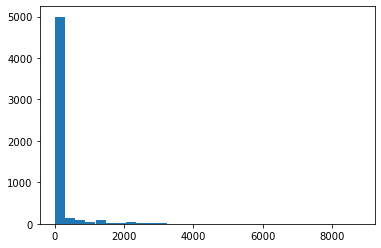

In [34]:
import matplotlib.pyplot as plt
hhs = np.array(gdpa.loc[gdpa['nhh']<100000, 'nhh' ])
plt.hist(hhs, bins = 30)

Distribution algorithm
0. for each hhid make a dictionary with lists (containing the instance number)
1. sort the grid-cells by size starting with the biggest
2. caclulate how many times the hh-samples can be placed in the grid-cell
3. take at least one from each and then start with the first 
4. take a hh from each sample type delete the instance until the cell is filled
5. when the number hhs in cell is smaller than the samples, fill from the first